In [1]:
import sys
sys.path.append('..')
from utils.visualize import *
from utils.spectrum import (read_spectrum, denorm_spectrum, norm_spectrum,
                            spectrum_psnrs, spectrum_ssims, spectrum_correlations,
                            get_mask)
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tqdm, os, torch

specs = {}

# Case study results

In [3]:
root = '/home/jhyang/WORKSPACES/MODELS/super_res/pl/cs'
sid = 's82'
print(sorted(os.listdir(root)))
os.listdir(os.path.join(root, sid, 'dbpn/finetune/s00_2x'))

['s61', 's63', 's64', 's65', 's66', 's67', 's68', 's75', 's76', 's79', 's80', 's81', 's82', 's83', 's84', 's85', 's86', 's87', 's88', 's89', 's91a', 's91b']


['00080.output',
 '00040.output',
 '00030.output',
 'output',
 '00050.output',
 '00090.model.th',
 '00100.model.th',
 '00020.output',
 '00040.model.th',
 '00050.model.th',
 '00010.model.th',
 '00010.output',
 '00060.output',
 '00070.model.th',
 '00070.output',
 '00030.model.th',
 'bic.None_729_2x.txt',
 '00090.output',
 'events.out.tfevents.1673361144.jhyangws2.2759517.0',
 '00100.output',
 'bic.728_729_2x.txt',
 '00080.model.th',
 '00060.model.th',
 '00020.model.th']

dict_keys(['728', '729']) dict_keys(['728_729_2x', '728_729_4x', 'None_729_2x', 'None_729_4x'])


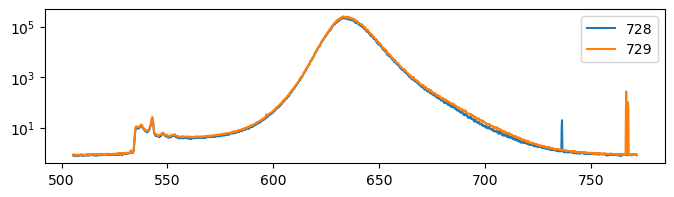

In [3]:
root = '/home/jhyang/WORKSPACES/MODELS/super_res/pl/cs'
sid  = 's82'
outs  = {}
bics  = {}
for i in [10, 20, 30, 50]:
    model_path = os.path.join(root, sid, f'dbpn/finetune/s00_2x/{i:05d}.output')
    if not os.path.isdir(model_path):
        continue
    if i in outs.keys():
        continue
    out = {}
    for fn in os.listdir(model_path):
        k = fn.split('_')[0]
        if '2x' in fn and k not in specs.keys() and k != 'None':
            specs[k] = read_spectrum(k)
        k = fn.split('_')[1]
        if '2x' in fn and k not in specs.keys():
            specs[k] = read_spectrum(k)
        k = fn.split('.')[0]
        out[k] = read_spectrum(fn, model_path)
    outs[i] = {k:v for k,v in sorted(out.items(), key=lambda x: x[0])}
    model_root = model_path.replace(f'{i:05d}.output','')
    if len(bics) == 0:
        for fn in os.listdir(model_root):
            if 'bic' not in fn: continue
            bics[fn.split('.')[1]] = read_spectrum(fn, model_root)
        
specs = {k:v for k,v in sorted(specs.items(), key=lambda x: x[0])}
print(specs.keys(), outs[10].keys())
x = [v for v in outs[10].values()][0][0]
f, ax = plt.subplots(1,1,figsize=(8,2))
for k, (x, y) in specs.items():
    v = np.var(y.reshape(x.shape[0], -1), axis=1)
    ax.plot(x, v, label=k)
ax.legend(loc='upper right')
ax.set_yscale('log')

## correlation

0.9534520255083531
0.9914037432388041


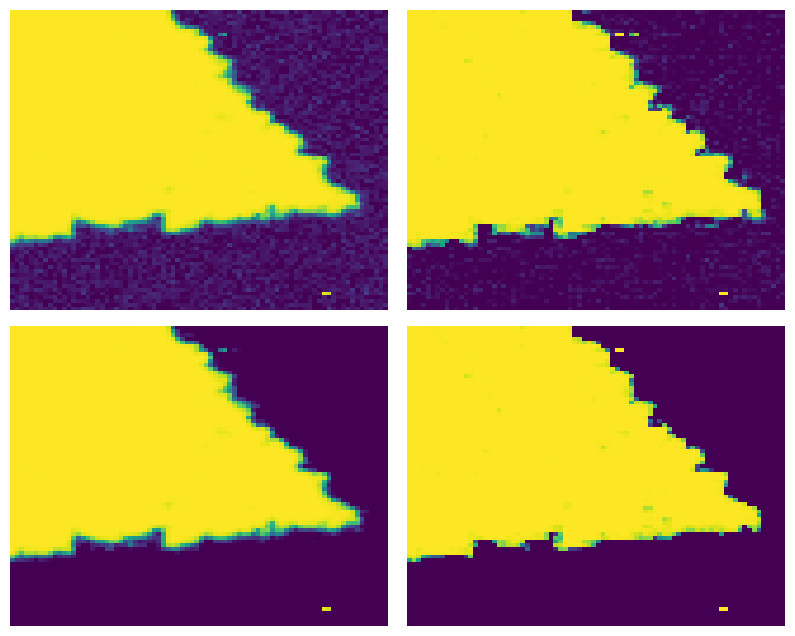

In [95]:
x, y = outs[10]['None_729_2x']
x_, y_ = specs['729']
snr = 0.05
vmax = np.max(y)
vmin = np.min(y)
mask = get_mask(x, x_)
xr = x_[mask]
yr = y_[mask]
noise = np.random.rand(*y.shape)
_, _, ny = norm_spectrum(y, vmin=vmin, vmax=vmax, mode='minmax')
_, _, nyr = norm_spectrum(yr, vmin=vmin, vmax=vmax, mode='minmax')

c1 = spectrum_correlations(yr, yr + noise*(vmax - vmin)*snr)
c2 = spectrum_correlations(yr, y)
ps = spectrum_psnrs(nyr, ny)
ss = spectrum_ssims(nyr, ny)
f, axs = plt.subplots(2,2,figsize=(10, 8))
axs[0,0].pcolormesh(c1.reshape(80,80), vmin=0, vmax=1)
axs[0,1].pcolormesh(c2.reshape(80,80), vmin=0, vmax=1)
print(np.average(c2, weights=c1))
nc1 = spectrum_correlations(nyr, nyr + noise*snr)
nc2 = spectrum_correlations(nyr, ny)
axs[1,0].pcolormesh(nc1.reshape(80,80), vmin=0, vmax=1)
axs[1,1].pcolormesh(nc2.reshape(80,80), vmin=0, vmax=1)
print(np.average(nc2, weights=nc1))
for ax in axs.reshape(-1): ax.axis('off')
f.subplots_adjust(wspace=0.05, hspace=0.05)

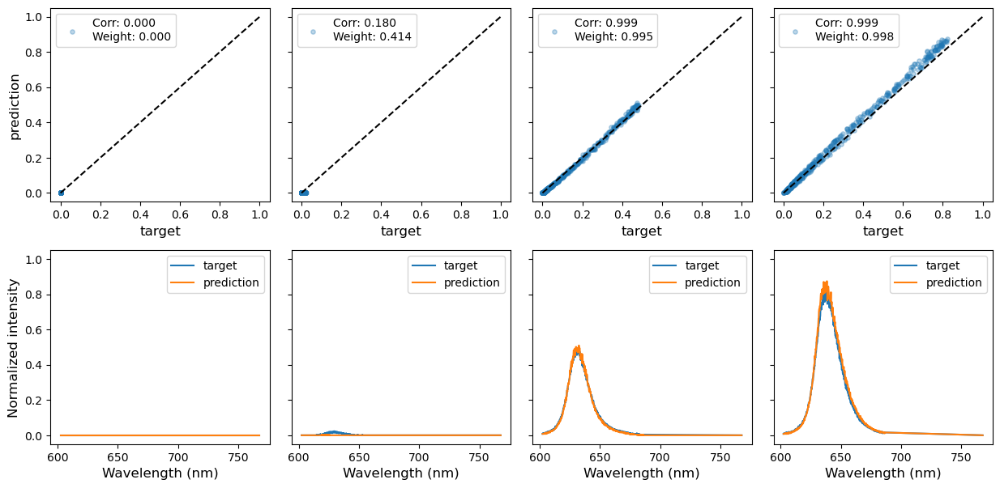

In [96]:
i,j=15,30
ks = [0, 5, 11, 19]
f, axs = plt.subplots(2,4,figsize=(15,7), sharey=True)
for l, k in enumerate(ks):
    axs[0, l].scatter(nyr[:,i+k,j+k], ny[:,i+k,j+k], alpha=0.3, s=15, label=f'Corr: {nc2.reshape(80,80)[i+k,j+k]:.3f}\nWeight: {nc1.reshape(80,80)[i+k,j+k]:.3f}')
    axs[0, l].plot([0,1],[0,1],color=[0,0,0],ls='--')
    axs[0, l].legend(loc='upper left')
    axs[0, l].set_xlabel('target', fontsize=12)
axs[0, 0].set_ylabel('prediction', fontsize=12)
for ax, k in zip(axs[1], ks):
    ax.plot(x, nyr[:,i+k,j+k], label='target')
    ax.plot(x, ny[:,i+k,j+k], label='prediction')
    ax.legend(loc='upper right')
    ax.set_xlabel('Wavelength (nm)', fontsize=12)
axs[1,0].set_ylabel('Normalized intensity', fontsize=12)
f.subplots_adjust(wspace=0.1, hspace=0.25)

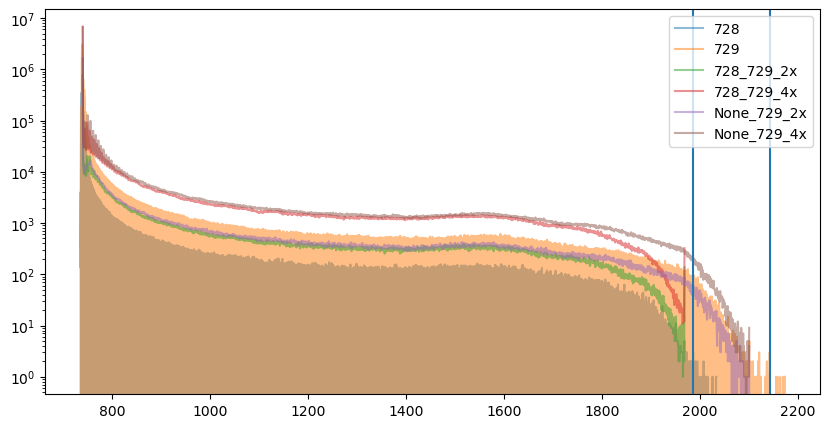

In [97]:
#c, b = np.histogram(specs['424'][1], bins=2000)
#plt.scatter(b[:-1], c, alpha=0.1)
#c, b = np.histogram(specs['425'][1], bins=2000)
#plt.scatter(b[:-1], c, alpha=0.1)
#plt.axvline(vmax)
#plt.yscale('log')
f, ax = plt.subplots(1,1,figsize=(10, 5))
for k, (x, y) in specs.items():
    c, b = np.histogram(y.reshape(-1), bins=2000)
    ax.plot(b[:-1], c, label=k, alpha=0.5)
for k, (x, y) in outs[30].items():
    c, b = np.histogram(y.reshape(-1), bins=2000)
    ax.plot(b[:-1], c, label=k, alpha=0.5)
ax.legend(loc='upper right')
ax.set_yscale('log')
for _, v in specs.values():
    _, _vmax, _ = norm_spectrum(v, ref=v, mode='histogram', min_count=2)
    ax.axvline(_vmax)


## scale bar

Text(0.5, 0, 'Normalized intensity')

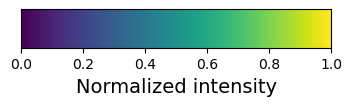

In [25]:
f, ax = plt.subplots(1,1,figsize=(4,0.5))
ax.pcolormesh(np.linspace(0,1,100).reshape(1,-1))
ax.set_yticklabels([])
ax.set_yticks([])
ax.set_xticks([0,20, 40, 60, 80, 100])
ax.set_xticklabels([0.0,0.20, 0.40, 0.60, 0.80, 1.0])
ax.set_xlabel('Normalized intensity', fontsize=14)

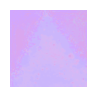

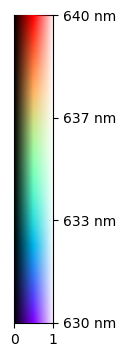

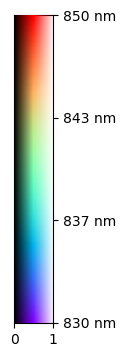

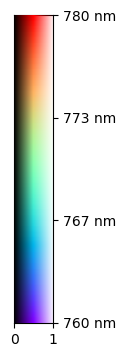

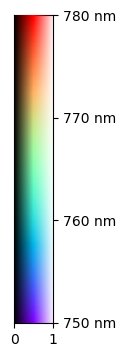

In [33]:
locss = [[630, 635, 640],
         [830, 840, 850],
         [760, 770, 780],
         [750, 765, 780]]
f, ax1 = plt.subplots(1,1,figsize=(1,1))
for locs in locss:
    f, ax = plt.subplots(1,1,figsize=(8, 4))
    plot_maxmap(ax1, x, y, xrange=[np.min(locs), np.max(locs)], yrange=[0,1], cax=ax, aspect_ratio=8)

## outputs

In [ ]:
locs = [830, 840, 850]
locs = [750, 765, 780]
locs = [760, 770, 780]
locs = [630, 635, 640]
tloc = [2, 60]
tc1, tc2 = [1,1,1], [1,1,1]
#ref = [v[1] for v in specs.values()][np.argmin([v[1].shape[-1] for v in specs.values()])]
ref = np.hstack([v[1].reshape(-1) for v in specs.values()])
vmin, vmax, _ = norm_spectrum(np.zeros((10)), ref=ref, mode='histogram', extend_bit=False, min_count=4)
for epoch, out in outs.items():
    measure = {}
    for k, (x,y) in out.items():
        if '2x' not in k: continue
        _x, _y = specs[k.split('_')[1]][:2]
        mask = get_mask(x, _x)
        xr = _x[mask]
        _, _, ny = norm_spectrum(y, vmin=vmin, vmax=vmax, mode='minmax', extend_bit=False)
        _, _, nyr = norm_spectrum(_y[mask], vmin=vmin, vmax=vmax, mode='minmax', extend_bit=False)
        measure[k] = {
            'psnr':spectrum_psnrs(nyr, ny),
            'ssim':spectrum_ssims(nyr, ny),
            'corr':spectrum_correlations(nyr, ny),
            'w1':np.var(nyr.reshape(xr.shape[0],-1), axis=1),
            'w2':spectrum_correlations(nyr, nyr + np.random.rand(*nyr.shape)*0.05)
        }
    j = 0
    c, r = len(out) + len(specs), len(locs)
    f, axs = plt.subplots(1, c, figsize=(c*4, 4))
    for k, (x, y) in specs.items():
        axs[j].set_title(f'{k}')
        plot_maxmap(axs[j], x, y, xrange=[np.min(locs), np.max(locs)], yrange=[vmin, vmax])
        j += 1
    for k, (x, y) in out.items():
        axs[j].set_title(f'Epoch:{epoch} / {k}')
        plot_maxmap(axs[j], x, y, xrange=[np.min(locs), np.max(locs)], yrange=[vmin, vmax])
        if k in measure.keys():
            info = f"PSNR: {np.average(measure[k]['psnr'], weights=measure[k]['w1']):.3f}\n"
            info += f"SSIM: {np.average(measure[k]['ssim'], weights=measure[k]['w1']):.3f}\n"
            info += f"CORR: {np.average(measure[k]['corr'], weights=measure[k]['w2']):.3f}\n"
            axs[j].text(*tloc, info, fontsize=10, color=tc1)
        j += 1
    f.subplots_adjust(wspace=0.05, hspace=0.05)
    f, axs = plt.subplots(r, c, figsize=(c*4, r*4))
    for i, (ax, loc) in enumerate(zip(axs, locs)):
        j = 0
        for k, (x, y) in specs.items():
            plot_map(ax[j], x, y, loc=loc, tol=1, vmin=vmin, vmax=vmax)
            if i == 0: ax[j].set_title(f'{k}')
            j += 1
        for k, (x, y) in out.items():
            n = k.split('_')[1]
            plot_map(ax[j], x, y, loc=loc, tol=1, vmin=vmin, vmax=vmax)
            if i == 0: ax[j].set_title(f'Epoch:{epoch} / {k}')
            if '2x' in k:
                l = np.argmin(np.abs(x - loc))
                info = f"PSNR: {measure[k]['psnr'][l]:.3f}\n"
                info += f"SSIM: {measure[k]['ssim'][l]:.3f}"
                ax[j].text(tloc[0],tloc[1]+10, info, fontsize=10, color=tc2)
            j += 1
    f.subplots_adjust(wspace=0.05, hspace=0.05)

# Global model results

In [5]:
specs['678'] = read_spectrum(678)
specs['680'] = read_spectrum(680)

In [ ]:
root = '/home/jhyang/WORKSPACES/MODELS/super_res/pl/all/dbpnv3x4b1/00010.output'
epochs = [1,2,3,4,5]
dbpn = {}
dbic = {}
for fn in [fn for fn in os.listdir(root.replace('00010.output','')) if fn.startswith('bic.')]:
    dbic[fn.split('.')[1]] = read_spectrum(fn, root=root.replace('00010.output',''))
print(sorted(os.listdir(root.replace('00010',f'{epochs[0]:05d}'))))
for i in tqdm.tqdm(epochs):
    _root = root.replace('00010',f'{i:05d}')
    output = {}
    for fn in sorted(os.listdir(_root)):
        output[fn.split('.')[0]] = read_spectrum(fn, root=_root)
        for k in fn.split('_')[:2]:
            print(k)
            if k == 'None':
                continue
            if k not in specs.keys():
                specs[k] = read_spectrum(k)
    dbpn[i] = output

In [22]:
os.listdir(root.replace('00010.output','00001.output'))

['None_728_4x.txt',
 '726_728_4x.txt',
 'None_682_4x.txt',
 'None_729_4x.txt',
 'None_680_16x.txt',
 'None_729_16x.txt',
 'None_682_16x.txt',
 '726_728_16x.txt',
 'None_728_16x.txt',
 '678_680_16x.txt',
 '727_729_4x.txt',
 '679_682_4x.txt',
 '679_682_16x.txt',
 '727_729_16x.txt',
 '678_680_4x.txt',
 'None_680_4x.txt']

[739.9596758427233, 2120.1278139069536]


/tmp/ipykernel_1083543/1761448061.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axs = plt.subplots(n+2-j, 1+len(locs), figsize=(4*(1+len(locs)), 4*(n+2-j)))


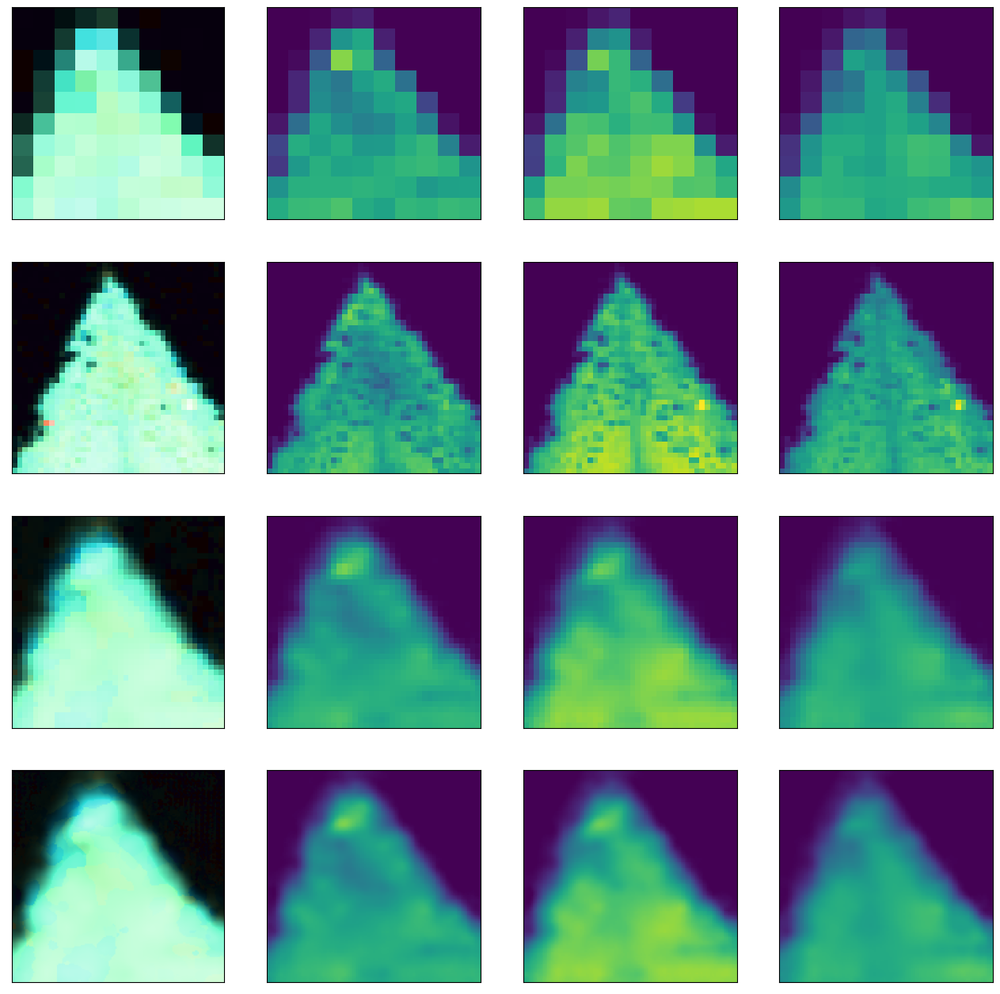

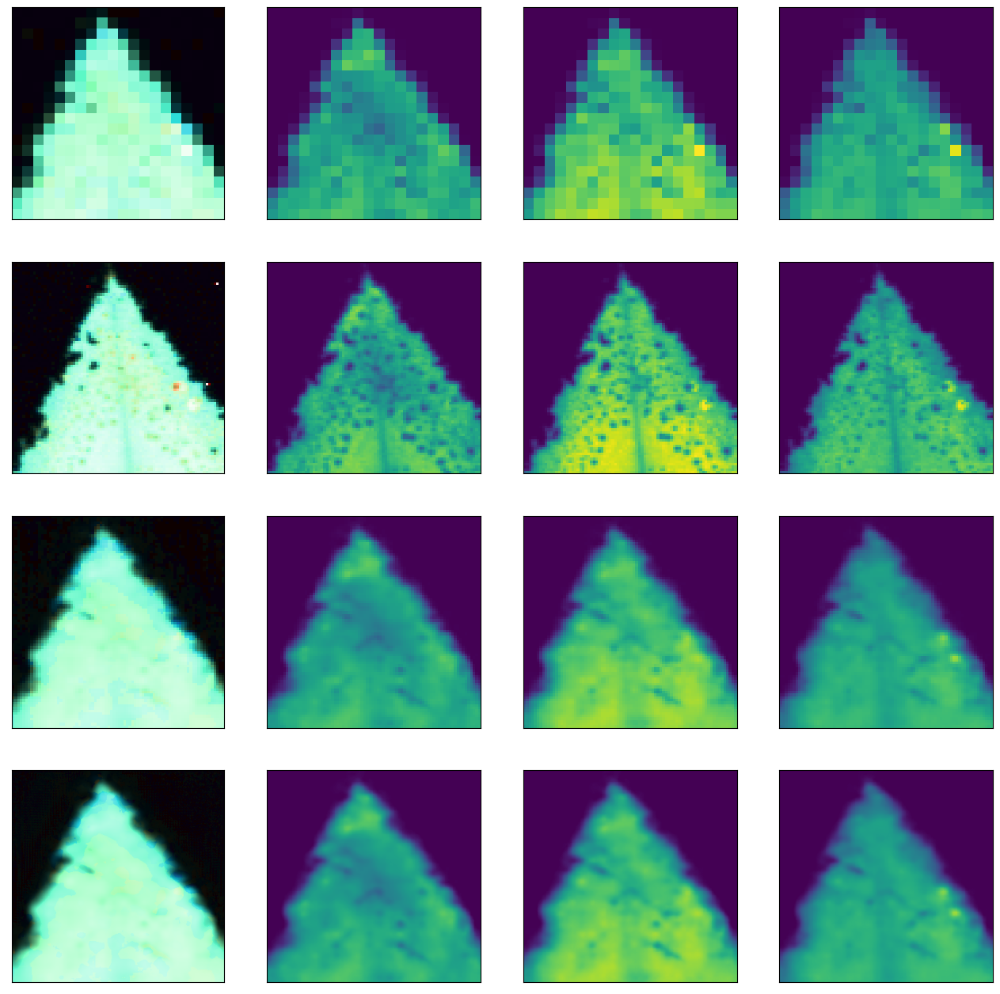

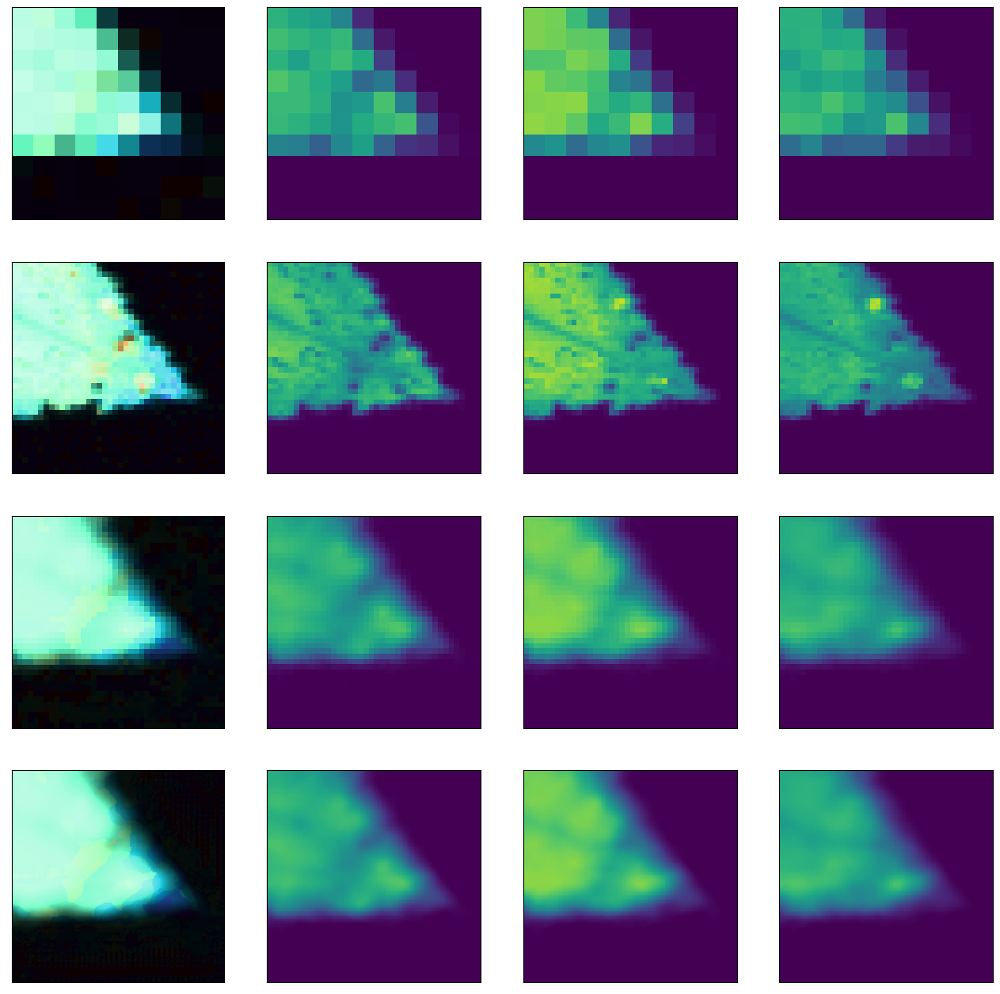

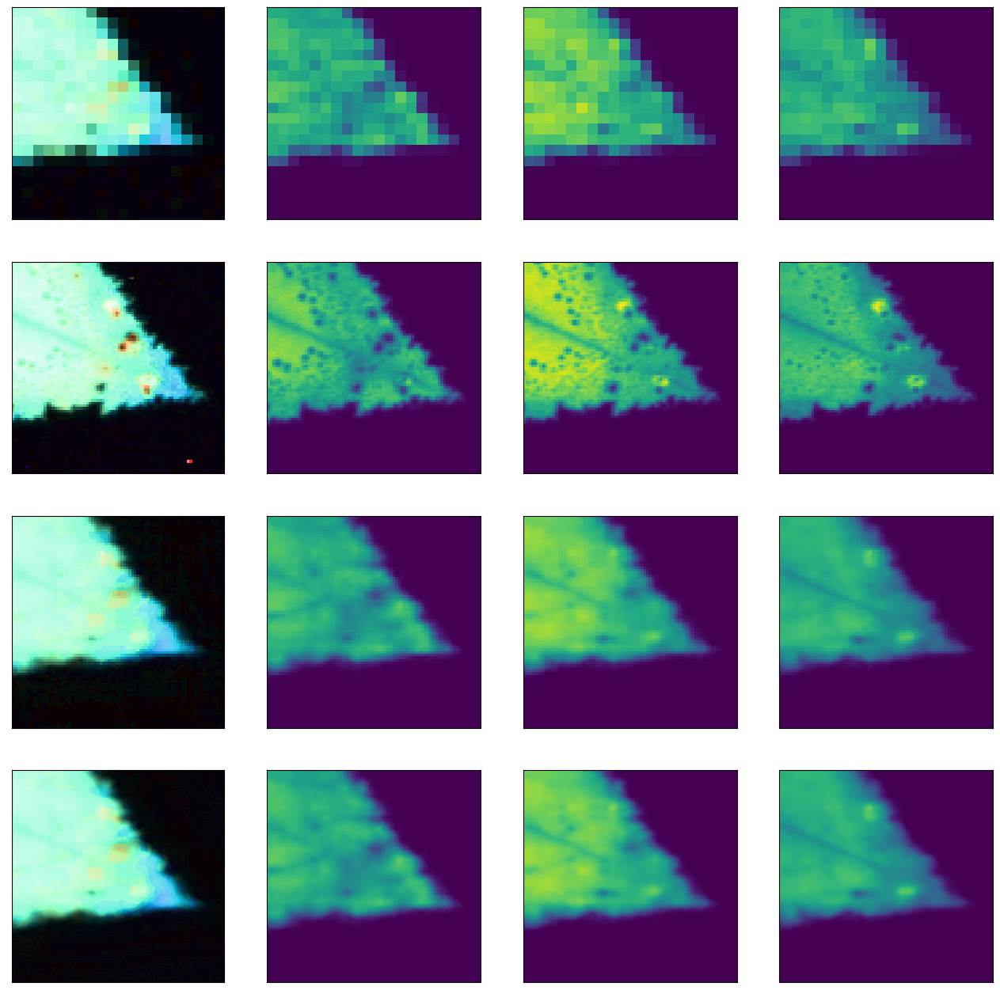

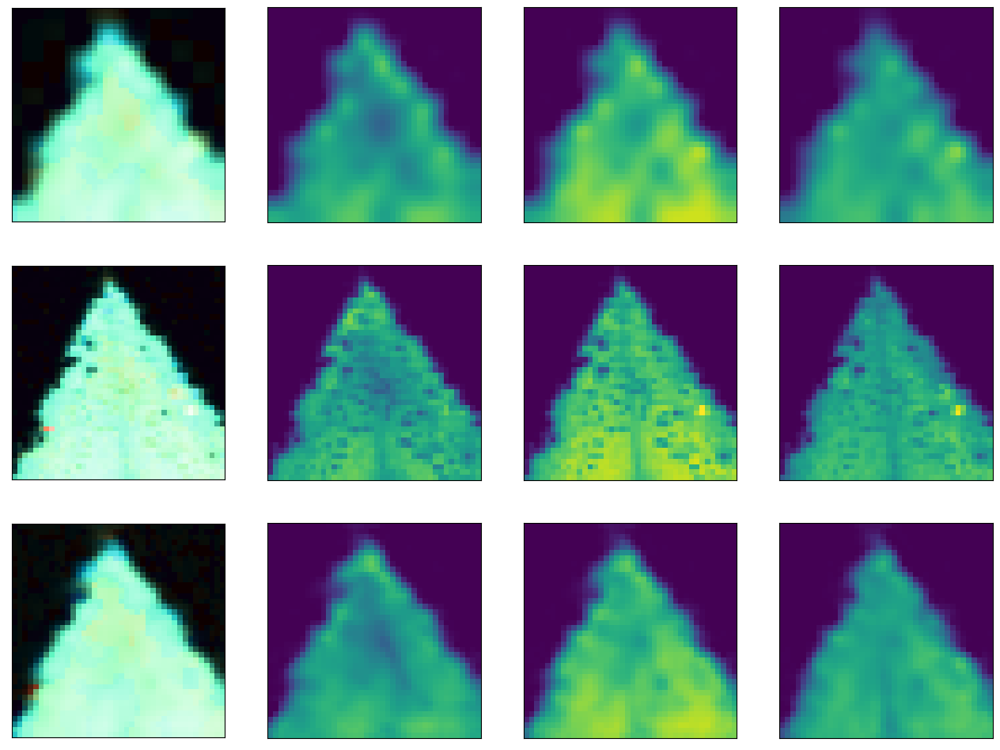

...

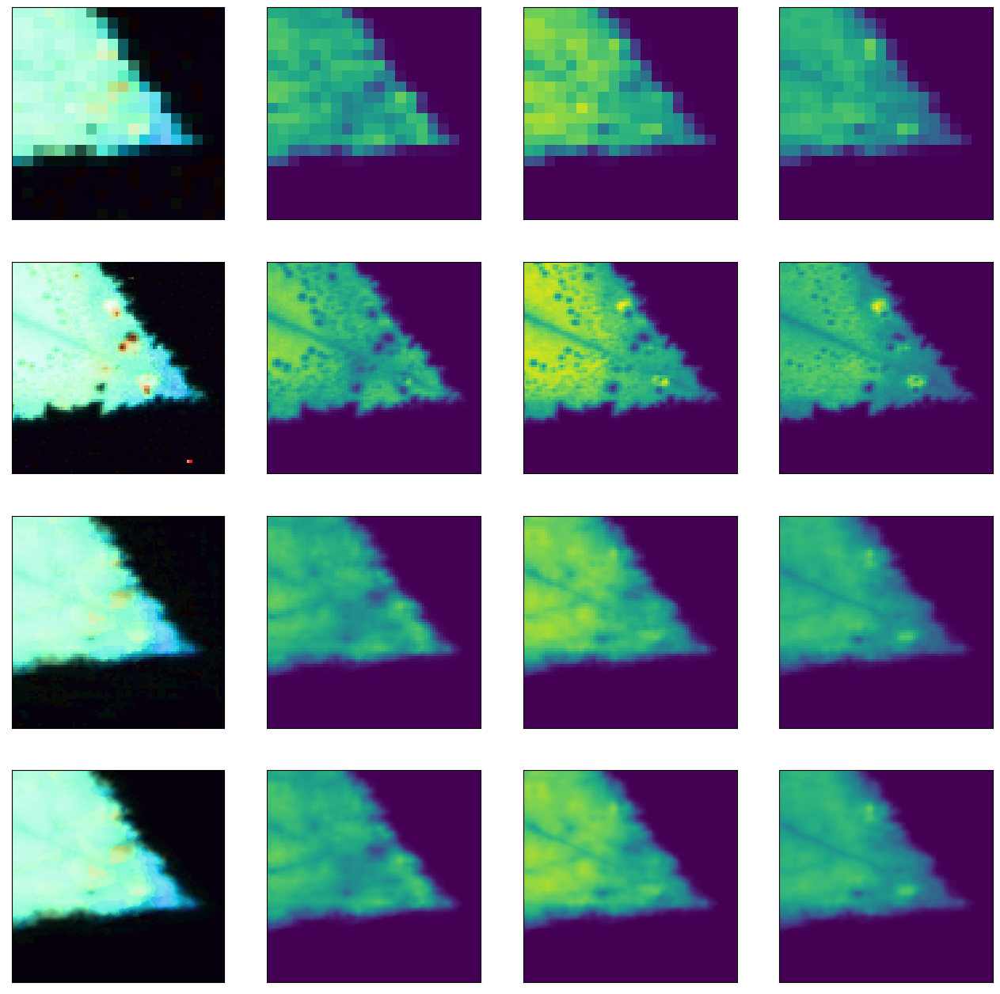

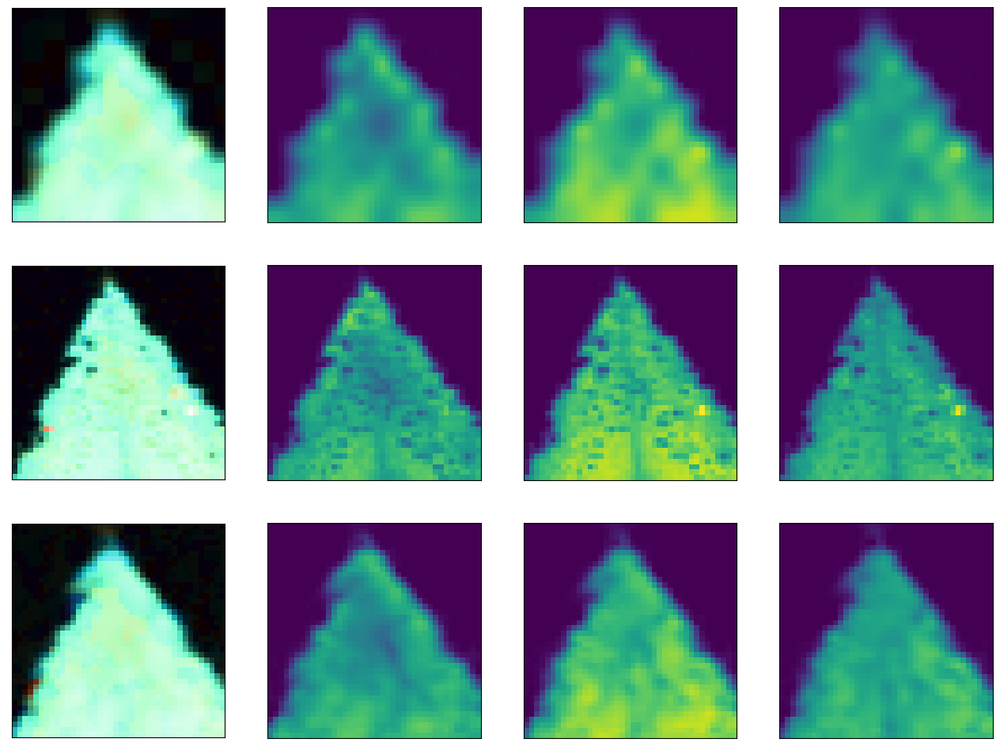

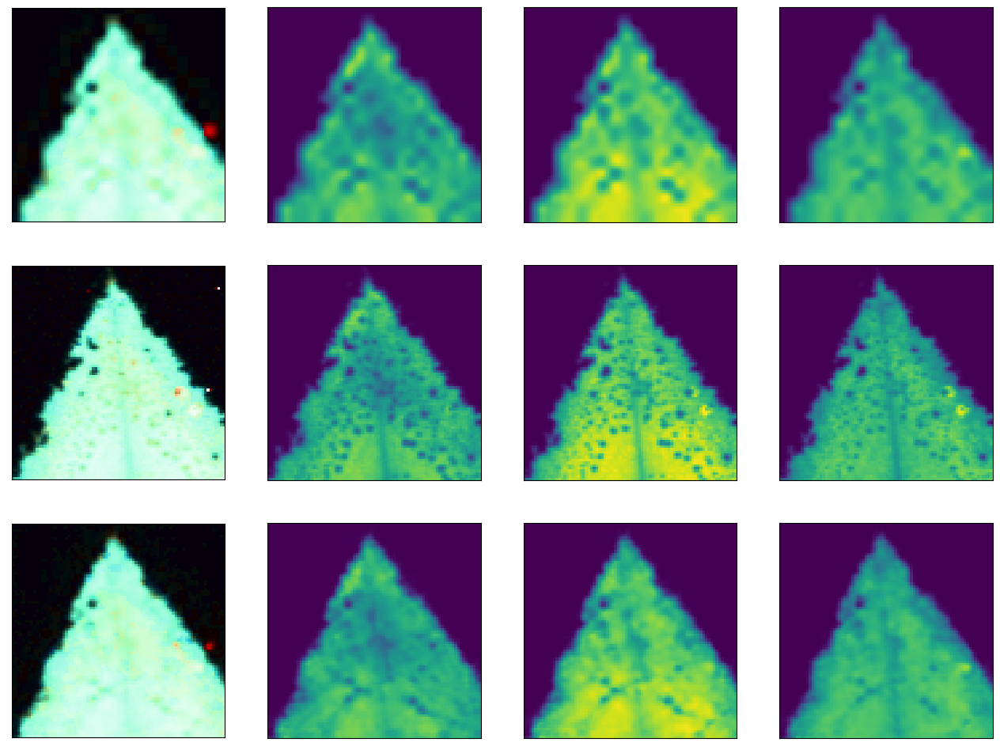

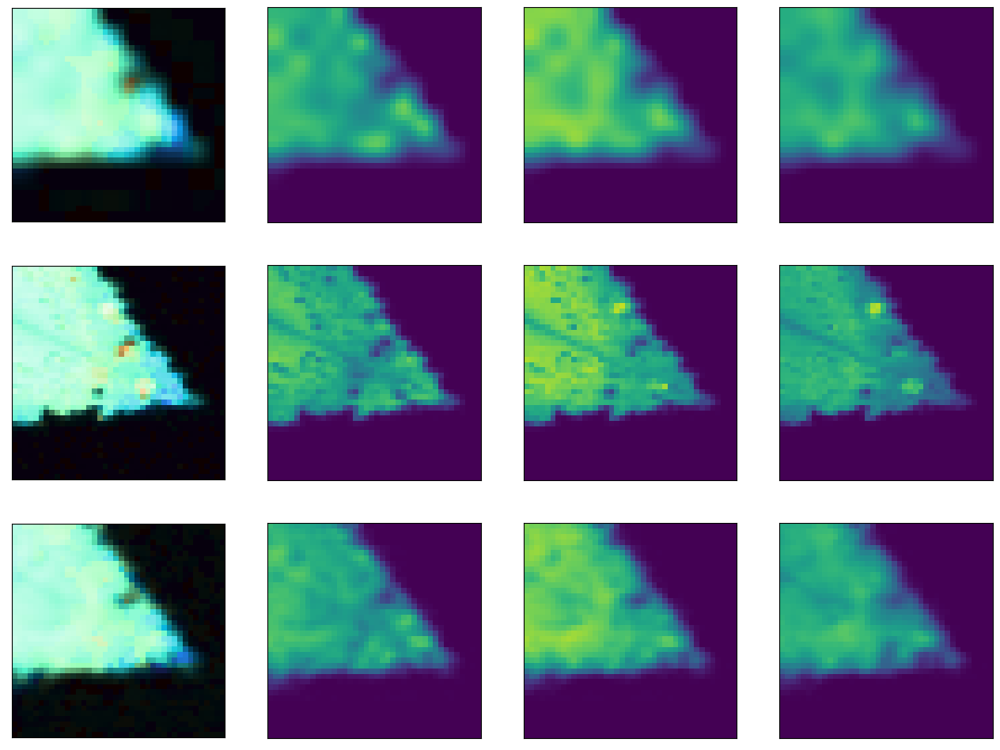

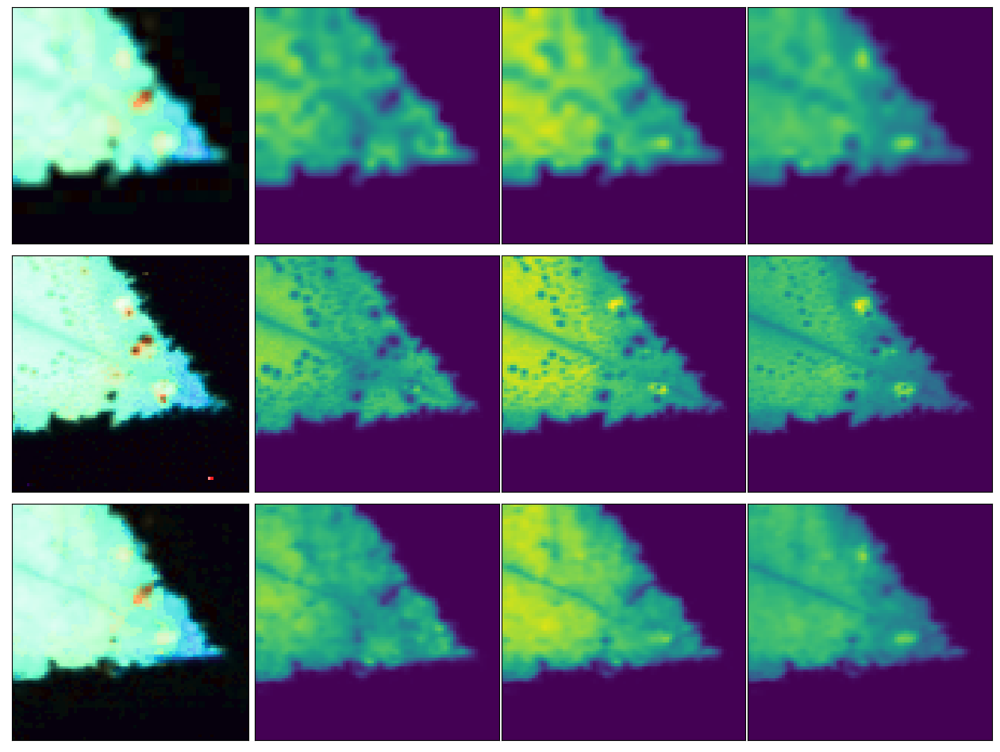

In [33]:
locs = [630, 635, 640]
tloc = [50, 65]
tc1, tc2 = [1,1,1], [1,1,1]
#ref = [v[1] for v in specs.values()][np.argmin([v[1].shape[-1] for v in specs.values()])]
ref = np.hstack([v[1].reshape(-1) for v in specs.values()])
vmin, vmax, _ = norm_spectrum(np.zeros((10)), ref=ref, mode='histogram', extend_bit=False, min_count=4)
xrange = [620, 650]
yrange = [vmin, vmax]
m = 4
print(yrange)
for epoch, out in dbpn.items():
    for _k in out.keys():
        if not _k.endswith(f'{m}x'):
            continue
        j = int(_k.startswith('None'))
        ks = sorted([k for k in out.keys() if _k.split(f'_{m}x')[0] in k], key=lambda x: x.split('_')[-1].replace('x',''), reverse=True)
        n = len(ks)
        f, axs = plt.subplots(n+2-j, 1+len(locs), figsize=(4*(1+len(locs)), 4*(n+2-j)))
        xys = []
        for k in _k.split('_')[:2]:
            if k in specs.keys():
                xys.append(specs[k])
            else:
                xys.append(dbic [_k])
        for k in ks:
            xys.append(out[k])
        for ax, (x, ys) in zip(axs, xys):
            plot_maxmap(ax[0], x, ys, xrange=xrange, yrange=yrange)
            for i, loc in enumerate(locs):
                plot_map(ax[i+1], x, ys, loc=loc, tol=0.5, vmin=yrange[0], vmax=yrange[1])
            
#        x1, y1 = specs[k.split('_')[1]][:2]
#        plot_maxmap(axs[i,1], x1, y1, xrange=xrange, yrange=yrange)
#        if not j:
#            x0, y0 = specs[k.split('_')[0]][:2]
#            plot_maxmap(axs[i,0], x0, y0, xrange=xrange, yrange=yrange)
#        plot_maxmap(axs[i,2], x2, y2, xrange=xrange, yrange=yrange)
#        for h, loc in enumerate(locs):
#            plot_map(axs[i,3+h], x2, y2, loc=loc, tol=1, vmin=yrange[0], vmax=yrange[1])
    f.subplots_adjust(wspace=0.01, hspace=0.05)


# Comparison 

- map

In [ ]:
locs = [630, 635, 640]
tloc = [50, 65]
tc1, tc2 = [1,1,1], [1,1,1]
#ref = [v[1] for v in specs.values()][np.argmin([v[1].shape[-1] for v in specs.values()])]
ref = np.hstack([v[1].reshape(-1) for v in specs.values()])
vmin, vmax, _ = norm_spectrum(np.zeros((10)), ref=ref, mode='histogram', extend_bit=False, min_count=4)
for epoch, out in outs.items():
#    if epoch > 10: continue
    f1, axs1 = plt.subplots(2, 6, figsize=(24, 8))
    f2, axs2 = plt.subplots(len(locs)*2, 6, figsize=(24, len(locs)*8))
    for k, (x1, y1) in out.items():
        if not k.endswith('_2x'): continue
        j = int(k.startswith('None'))
        x, y = specs[k.split('_')[1]][:2]
        x2, y2 = dbpn[epoch][k]
        xb, yb = dbic[k]
        for h, (x_sr, y_sr) in enumerate([(xb, yb), (x1, y1), (x2, y2)]):
            i = 1 + np.sum(np.arange(h+1))
            m = get_mask(x, x_sr)
            _, _, ny = norm_spectrum(y_sr, vmin=vmin, vmax=vmax, mode='minmax', extend_bit=False)
            _, _, nyr = norm_spectrum(y[m], vmin=vmin, vmax=vmax, mode='minmax', extend_bit=False)
            plot_maxmap(axs1[j, i], x_sr, y_sr, xrange=[np.min(locs), np.max(locs)], yrange=[vmin, vmax])
            w1 = np.var(nyr.reshape(x1.shape[0],-1), axis=1)
            w2 = spectrum_correlations(nyr, nyr + np.random.rand(*nyr.shape)*0.05)
            psnrs = spectrum_psnrs(nyr, ny)
            ssims = spectrum_ssims(nyr, ny)
            corr = np.average(spectrum_correlations(nyr, ny), weights=w2)
            axs1[j, i].text(*tloc, f'PSNR: {np.average(psnrs, weights=w1):.3f}\nSSIM: {np.average(ssims, weights=w1):.3f}\nCORR: {corr:.3f}', fontsize=10, color=tc1)
            for g, loc in enumerate(locs):
                idx = np.argmin(np.abs(x_sr - loc))
                plot_map(axs2[j+g*2, i], x_sr, y_sr, loc=loc, tol=1)
                axs2[j+g*2, i].text(*tloc, f'PSNR: {psnrs[idx]:.3f}\nSSIM: {ssims[idx]:.3f}', fontsize=10, color=tc1)
        if j == 0:
            _x, _y = specs[k.split('_')[0]][:2]
            plot_maxmap(axs1[0, 0], _x, _y, xrange=[np.min(locs), np.max(locs)], yrange=[vmin, vmax])
            plot_maxmap(axs1[1, 0], x, y, xrange=[np.min(locs), np.max(locs)], yrange=[vmin, vmax])
            for g, loc in enumerate(locs):
                plot_map(axs2[g*2, 0], _x, _y, loc=loc, tol=1)
                plot_map(axs2[g*2+1, 0], x, y, loc=loc, tol=1)
        kk = k.replace('2x','4x')
        x1, y1 = out[kk]
        x2, y2 = dbpn[epoch][kk]
        plot_maxmap(axs1[j, 3], x1, y1, xrange=[np.min(locs), np.max(locs)], yrange=[vmin, vmax])
        plot_maxmap(axs1[j, 5], x2, y2, xrange=[np.min(locs), np.max(locs)], yrange=[vmin, vmax])
        for g, loc in enumerate(locs):
            plot_map(axs2[g*2+j, 3], x1, y1, loc=loc, tol=1)
            plot_map(axs2[g*2+j, 5], x2, y2, loc=loc, tol=1)
    f1.subplots_adjust(wspace=0.05, hspace=0.05)
    f2.subplots_adjust(wspace=0.05, hspace=0.05)


- diff

In [ ]:
locs = [630]
tloc = [50, 65]
tc1, tc2 = [1,1,1], [1,1,1]
#ref = [v[1] for v in specs.values()][np.argmin([v[1].shape[-1] for v in specs.values()])]
ref = np.hstack([v[1].reshape(-1) for v in specs.values()])
vmin, vmax, _ = norm_spectrum(np.zeros((10)), ref=ref, mode='histogram', extend_bit=False, min_count=4)
for epoch, out in outs.items():
#    if epoch > 10: continue
    f2, axs2 = plt.subplots(len(locs), 4, figsize=(16, len(locs)*4))
    axs2 = axs2.reshape(len(locs), -1)
    for k, (x1, y1) in out.items():
        if not k.endswith('_2x'): continue
        j = int(k.startswith('None'))
#        x, y = specs[k.split('_')[1]][:2]
        x, y = bics[k]
        x2, y2 = dbpn[epoch][k]
        for h, (x_sr, y_sr) in enumerate([(x1, y1), (x2, y2)]):
            i = j*2 + h
            m = get_mask(x, x_sr)
#            _, _, ny = norm_spectrum(y_sr, vmin=vmin, vmax=vmax, mode='minmax', extend_bit=False)
#            _, _, nyr = norm_spectrum(y[m], vmin=vmin, vmax=vmax, mode='minmax', extend_bit=False)
#            psnrs = spectrum_psnrs(nyr, ny)
#            ssims = spectrum_ssims(nyr, ny)
            for g, loc in enumerate(locs):
                idx = np.argmin(np.abs(x_sr - loc))
                plot_map(axs2[g, i], x_sr, y_sr - y[m], loc=loc, tol=1, cmap='RdBu_r', vmin=-100, vmax=100)
#                axs2[j+g*2, i].text(*tloc, f'PSNR: {psnrs[idx]:.3f}\nSSIM: {ssims[idx]:.3f}', fontsize=10, color=tc1)
    f1.subplots_adjust(wspace=0.05, hspace=0.05)
    f2.subplots_adjust(wspace=0.05, hspace=0.05)


- diff hist

In [7]:
root = '/home/jhyang/WORKSPACES/MODELS/super_res/pl/all/dbpnv3/00010.output'
dbpn_2x = {}
dbic = {}
for fn in [fn for fn in os.listdir(root.replace('00010.output','')) if fn.startswith('bic.')]:
    dbic[fn.split('.')[1]] = read_spectrum(fn, root=root.replace('00010.output',''))
    if fn.split('_')[1] not in specs.keys():
        specs[fn.split('_')[1]] = read_spectrum(fn.split('_')[1])
for i in tqdm.tqdm(range(55)):
    _root = root.replace('00010',f'{i:05d}')
    if not os.path.isdir(_root): continue
    output = {}
    for fn, (xb, yb) in dbic.items():
        x, y = read_spectrum(fn + '.txt', root=_root)
        m = get_mask(x, xb)
        output[fn] = xb, y[m]
    dbpn_2x[i] = output

100%|██████████| 55/55 [00:10<00:00,  5.39it/s]


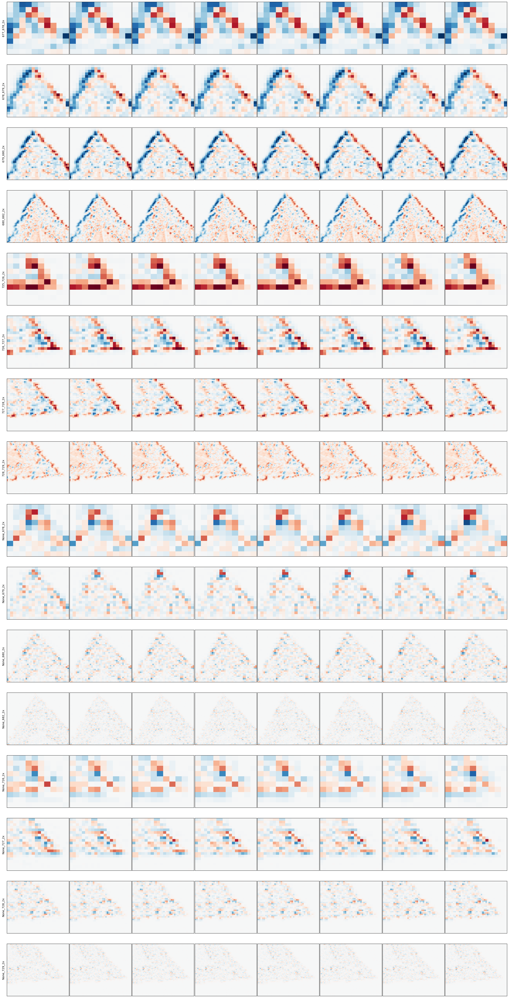

In [29]:
epochs = [1, 2, 4, 6, 8, 10, 20, 50]
loc = 630
f, axs = plt.subplots(len(dbic), len(epochs), figsize=(len(epochs)*4, len(dbic)*4))
for i, (key, (xb, yb)) in enumerate(sorted(dbic.items(), key=lambda x:x[0])):
    axs[i,0].set_ylabel(key)
    xr, yr = specs[key.split('_')[1]]
    m = get_mask(xr, xb)
    for j, epoch in enumerate(epochs):
#        diff = dbpn_2x[epoch][key][1] - yb
        diff = dbpn_2x[epoch][key][1] - yr[m]
        plot_map(axs[i,j], x, diff, loc=loc, tol=0.2, vmin=-500, vmax=500, cmap='RdBu')
f.subplots_adjust(wspace=0.01)

In [80]:
root = '/home/jhyang/WORKSPACES/MODELS/super_res/pl/all/rbpnv3x4/00010.output'
print(sorted(os.listdir(root)))
rbpn = {}
rbic = {}
for fn in [fn for fn in os.listdir(root.replace('00010.output','')) if fn.startswith('bic.')]:
    rbic[fn.split('.')[1]] = read_spectrum(fn, root=root.replace('00010.output',''))
for i in tqdm.tqdm(epochs):
    _root = root.replace('00010',f'{i:05d}')
    if os.path.isdir(_root.replace('output','valid')):
        for fn in os.listdir(_root.replace('output','valid')):
            os.rename(os.path.join(_root.replace('output','valid'), fn),
                      os.path.join(_root, fn))
    output = {}
    for fn in sorted(os.listdir(_root)):
        output[fn.split('.')[0]] = read_spectrum(fn, root=_root)
    rbpn[i] = output

['678_680_16x.txt', '678_680_4x.txt', '678_680_64x.txt', '679_682_16x.txt', '679_682_4x.txt', '726_728_16x.txt', '726_728_4x.txt', '726_728_64x.txt', '727_729_16x.txt', '727_729_4x.txt', 'None_680_16x.txt', 'None_680_4x.txt', 'None_680_64x.txt', 'None_682_16x.txt', 'None_682_4x.txt', 'None_728_16x.txt', 'None_728_4x.txt', 'None_728_64x.txt', 'None_729_16x.txt', 'None_729_4x.txt']


100%|██████████| 2/2 [01:19<00:00, 39.82s/it]


In [40]:
specs = {}
for fn in [v for v in rbpn.values()][0].keys():
    i1, i2 = fn.split('_')[:2]
    for i in [i1, i2]:
        if i == 'None': continue
        if i in specs.keys(): continue
        specs[i] = read_spectrum(i)
nspecs = {}
f, axs = plt.subplots(len(specs), 1, figsize=(8, 2*len(specs)))
for ax, (k, (x, y)) in zip(axs, specs.items()):
    vmin, vmax, ynorm = norm_spectrum(y, ref=y)
    nspecs[k] = (x, vmin, vmax, ynorm)
    n1 = np.sum(y >= vmax)
    n2 = np.sum(y <= vmin)
    ax.hist(y.reshape(-1), bins=np.linspace(700,2500,100), label=f'{k} ({y.shape})\nMin:{vmin:.2f} ({n2})\nMax:{vmax:.2f} ({n1})')
    ax.axvline(vmin, ls='--', lw=0.5, color=[0,0,0])
    ax.axvline(vmax, ls='--', lw=0.5, color=[0,0,0])
    ax.legend(loc='upper right')
    ax.set_yscale('log')

NameError: name 'rbpn' is not defined

In [152]:
pairs = [[677, 678], [678, 679], [679, 680], [680, 682]]
pairs = [[725, 726], [726, 727], [727, 728], [728, 729]]
xrange = [630, 640]
yrange = [700, 2000]
for (i1, i2) in pairs:
    f, axs = plt.subplots(len(outputs), 4, figsize=(16,len(outputs)*4))
    for ax, out in zip(axs, outputs.values()):
        x0, ys0 = specs[str(i1)]
        x1, ys1 = specs[str(i2)]
        vmin, vmax, nys1 = norm_spectrum(ys1)
        for i in range(10):
            m = f'{2**(10-i)}x'
            if f'{i1}_{i2}_{m}' in out.keys():
                break
        x2,  ys2  = out[f'{i1}_{i2}_{m}']
        x2p, ys2p = out[f'{i1}_{i2}_2x']
        x3,  ys3  = out[f'None_{i2}_{m}']
        x3p, ys3p = out[f'None_{i2}_2x']
        plot_maxmap(ax[0], x0, ys0, xrange=xrange, yrange=yrange)
        plot_maxmap(ax[1], x1, ys1, xrange=xrange, yrange=yrange)
        plot_maxmap(ax[2], x2, ys2, xrange=xrange, yrange=yrange)
        plot_maxmap(ax[3], x3, ys3, xrange=xrange, yrange=yrange)
        ax[0].scatter([1],[1],alpha=0,label='{}x{}'.format(*ys0.shape[1:]))
        ax[1].scatter([1],[1],alpha=0,label='{}x{}'.format(*ys1.shape[1:]))
        for x, y, ax_ in zip([x2p, x3p],[ys2p,ys3p], ax[2:4]):
            _, _, ny = norm_spectrum(y, vmin=vmin, vmax=vmax, mode='minmax')
            mask = get_mask(x, x1)
            w1 = np.var(nys1[mask].reshape(np.sum(mask), -1), axis=1)
            err = (np.random.rand(*ny.shape) - 0.5) * 0.05
            w2 = spectrum_correlations(nys1[mask], nys1[mask] + err)
            psnrs = spectrum_psnrs(nys1[mask], ny)
            ssims = spectrum_ssims(nys1[mask], ny)
            corrs = spectrum_correlations(nys1[mask], ny)
            ax_.scatter([1],[1],alpha=0,label='PSNR: {:.2f}\nSSIM: {:.3f}\nCORR: {:.3f}'.format(
                np.average(psnrs, weights=w1), np.average(ssims, weights=w1), np.average(corrs, weights=w2)
            ))
        for ax_ in ax:
            ax_.legend(loc='upper right', framealpha=0, labelcolor='w', fontsize=15)
    f.subplots_adjust(wspace=0.05, hspace=0.05)

<Figure size 1600x1600 with 16 Axes>

<Figure size 1600x1600 with 16 Axes>

<Figure size 1600x1600 with 16 Axes>

<Figure size 1600x1600 with 16 Axes>

In [8]:
dbpn[20].keys(), rbpn[20].keys()

(dict_keys(['677_678_16x', '677_678_2x', '677_678_32x', '677_678_4x', '677_678_64x', '677_678_8x', '678_679_16x', '678_679_2x', '678_679_32x', '678_679_4x', '678_679_8x', '679_680_16x', '679_680_2x', '679_680_4x', '679_680_8x', '680_682_2x', '680_682_4x', '680_682_8x', '725_726_16x', '725_726_2x', '725_726_32x', '725_726_4x', '725_726_64x', '725_726_8x', '726_727_16x', '726_727_2x', '726_727_32x', '726_727_4x', '726_727_8x', '727_728_16x', '727_728_2x', '727_728_4x', '727_728_8x', '728_729_2x', '728_729_4x', '728_729_8x', 'None_678_16x', 'None_678_2x', 'None_678_32x', 'None_678_4x', 'None_678_64x', 'None_678_8x', 'None_679_16x', 'None_679_2x', 'None_679_32x', 'None_679_4x', 'None_679_8x', 'None_680_16x', 'None_680_2x', 'None_680_4x', 'None_680_8x', 'None_682_2x', 'None_682_4x', 'None_682_8x', 'None_726_16x', 'None_726_2x', 'None_726_32x', 'None_726_4x', 'None_726_64x', 'None_726_8x', 'None_727_16x', 'None_727_2x', 'None_727_32x', 'None_727_4x', 'None_727_8x', 'None_728_16x', 'None_728_

In [16]:
pairs = [[726, 727], [727, 728], [728, 729]]
pairs = [[678, 679], [679, 680], [680, 682]]
xrange = [630, 640]
yrange = [700, 2000]

for (i1, i2) in pairs:
    f, axss = plt.subplots(len(epochs), 6, figsize=(30, 5*len(epochs)))
    x0, _, _, nys0 = nspecs[str(i1)]
    x1, vmin, vmax, nys1 = nspecs[str(i2)]
    for i in range(10):
        m = f'{2**(10-i)}x'
        if f'{i1}_{i2}_{m}' in dbpn[epoch].keys():
            break
    for epoch, axs in zip(epochs, axss):
        plot_maxmap(axs[0], x0, nys0, xrange=xrange, yrange=[0,1])
        plot_maxmap(axs[1], x1, nys1, xrange=xrange, yrange=[0,1])
        axs[0].scatter([1],[1],alpha=0,label='{}x{}'.format(*nys0.shape[1:]))
        axs[1].scatter([1],[1],alpha=0,label='{}x{}'.format(*nys1.shape[1:]))
        for j, out in enumerate([dbpn[epoch], rbpn[epoch]]):
            x2,  ys2  = out[f'{i1}_{i2}_{m}']
            x2p, ys2p = out[f'{i1}_{i2}_2x']
            x3,  ys3  = out[f'None_{i2}_{m}']
            x3p, ys3p = out[f'None_{i2}_2x']
            _, _, nys2 = norm_spectrum(ys2, vmin=vmin, vmax=vmax, mode='minmax')
            _, _, nys3 = norm_spectrum(ys3, vmin=vmin, vmax=vmax, mode='minmax')
            plot_maxmap(axs[2 + j * 2], x2, nys2, xrange=xrange, yrange=[0,1])
            plot_maxmap(axs[2 + j * 2 + 1], x3, nys3, xrange=xrange, yrange=[0,1])
            for x, y, ax in zip([x2p, x3p],[ys2p,ys3p], axs[2+j*2:4+j*2]):
                _, _, ny = norm_spectrum(y, vmin=vmin, vmax=vmax, mode='minmax')
                mask = get_mask(x, x1)
                w1 = np.var(nys1[mask].reshape(np.sum(mask), -1), axis=1)
                err = (np.random.rand(*ny.shape) - 0.5) * 0.05
                w2 = spectrum_correlations(nys1[mask], nys1[mask] + err)
                psnrs = spectrum_psnrs(nys1[mask], ny)
                ssims = spectrum_ssims(nys1[mask], ny)
                corrs = spectrum_correlations(nys1[mask], ny)
                ax.scatter([1],[1],alpha=0,label='PSNR: {:.2f}\nSSIM: {:.3f}\nCORR: {:.3f}'.format(
                    np.average(psnrs, weights=w1), np.average(ssims, weights=w1), np.average(corrs, weights=w2)
                ))
        for ax in axs:
            ax.legend(loc='upper right', framealpha=0, labelcolor='w', fontsize=15)
    f.subplots_adjust(wspace=0.05, hspace=0.05)

<Figure size 3000x1500 with 18 Axes>

<Figure size 3000x1500 with 18 Axes>

<Figure size 3000x1500 with 18 Axes>

In [36]:
ks = sorted([k for k in dbpn[epochs[0]].keys() if f'_{i2}_' in k])
nks = [k for k in ks if 'None' in k]
iks = [k for k in ks if 'None' not in k]
nks, iks

(['None_682_2x', 'None_682_4x', 'None_682_8x'],
 ['680_682_2x', '680_682_4x', '680_682_8x'])

In [35]:
dset.keys()

dict_keys(['678_680_16x', '678_680_4x', '678_680_64x', '679_682_16x', '679_682_4x', '726_728_16x', '726_728_4x', '726_728_64x', '727_729_16x', '727_729_4x', 'None_680_16x', 'None_680_4x', 'None_680_64x', 'None_682_16x', 'None_682_4x', 'None_728_16x', 'None_728_4x', 'None_728_64x', 'None_729_16x', 'None_729_4x'])

In [37]:
ids = [680, 682]
xrange = [630, 640]

for i2 in ids:
    f, axss = plt.subplots(len(epochs), 5, figsize=(30, 5*len(epochs)))
    x1, vmin, vmax, nys1 = nspecs[str(i2)]
    for epoch, axs in zip(epochs, axss):
        plot_maxmap(axs[0], x1, nys1, xrange=xrange, yrange=[0,1])
        axs[0].scatter([1],[1],alpha=0,label='{}x{}'.format(*nys1.shape[1:]))
        for j, dset in enumerate([dbpn[epoch], rbpn[epoch]]):
            ks = sorted([k for k in dset.keys() if f'_{i2}_' in k], key=lambda x: int(x.split('_')[-1].replace('x','')))
            nks = [k for k in ks if 'None' in k]
            iks = [k for k in ks if 'None' not in k]

            x2,  ys2  = dset[iks[-1]]
            x2p, ys2p = dset[iks[0]]
            x3,  ys3  = dset[nks[-1]]
            x3p, ys3p = dset[nks[0]]
            _, _, nys2 = norm_spectrum(ys2, vmin=vmin, vmax=vmax, mode='minmax')
            _, _, nys3 = norm_spectrum(ys3, vmin=vmin, vmax=vmax, mode='minmax')
            plot_maxmap(axs[1 + j * 2], x2, nys2, xrange=xrange, yrange=[0,1])
            plot_maxmap(axs[1 + j * 2 + 1], x3, nys3, xrange=xrange, yrange=[0,1])
            for x, y, ax in zip([x2p, x3p],[ys2p,ys3p], axs[1+j*2:3+j*2]):
                _, _, ny = norm_spectrum(y, vmin=vmin, vmax=vmax, mode='minmax')
                mask = get_mask(x, x1)
                w1 = np.var(nys1[mask].reshape(np.sum(mask), -1), axis=1)
                err = (np.random.rand(*ny.shape) - 0.5) * 0.05
                w2 = spectrum_correlations(nys1[mask], nys1[mask] + err)
                psnrs = spectrum_psnrs(nys1[mask], ny)
                ssims = spectrum_ssims(nys1[mask], ny)
                corrs = spectrum_correlations(nys1[mask], ny)
                ax.scatter([1],[1],alpha=0,label='PSNR: {:.2f}\nSSIM: {:.3f}\nCORR: {:.3f}'.format(
                    np.average(psnrs, weights=w1), np.average(ssims, weights=w1), np.average(corrs, weights=w2)
                ))
        for ax in axs:
            ax.legend(loc='upper right', framealpha=0, labelcolor='w', fontsize=15)
    f.subplots_adjust(wspace=0.05, hspace=0.05)

<Figure size 3000x1000 with 10 Axes>

<Figure size 3000x1000 with 10 Axes>

In [67]:
nspecs['682']

(array([505.432, 505.6  , 505.768, ..., 771.289, 771.453, 771.618]),
 739.9854384699389,
 2120.1278139069536,
 array([[[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],
 
        ...,
 
        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..

In [73]:
f, ax = plt.subplots(1,1,figsize=(5,5))
plot_maxmap(ax, nspecs['682'][0], nspecs['682'][3], xrange=xrange, yrange=[0,1])
ax.axis('on')
ax.set_xticks([i*20 - 0.5 for i in range(5)], labels=[i*5 for i in range(5)])
ax.set_yticks([i*20 - 0.5 for i in range(5)], labels=[i*5 for i in range(5)])
ax.set_ylabel('$y$ ($\mu$m)', fontsize=12)
ax.set_xlabel('$x$ ($\mu$m)', fontsize=12)

Text(0.5, 0, '$x$ ($\\mu$m)')

<Figure size 500x500 with 1 Axes>

In [91]:
rbpn[70].keys()

dict_keys(['678_680_16x', '678_680_4x', '678_680_64x', '679_682_16x', '679_682_4x', '726_728_16x', '726_728_4x', '726_728_64x', '727_729_16x', '727_729_4x', 'None_680_16x', 'None_680_4x', 'None_680_64x', 'None_682_16x', 'None_682_4x', 'None_728_16x', 'None_728_4x', 'None_728_64x', 'None_729_16x', 'None_729_4x'])

In [89]:
rbic.keys()

dict_keys(['678_680_4x', '726_728_4x', 'None_682_4x', '679_682_4x', 'None_728_4x', 'None_729_4x', 'None_680_4x', '727_729_4x'])

In [113]:
vmax - vmin

1380.1423754370148

In [148]:
x0, ys0 = dbic['679_680_2x']
x1, ys1 = dbpn[70]['679_680_2x']

In [149]:
locs = np.linspace(625, 645, 5)
f, axs = plt.subplots(1, 6, figsize=(20, 4), gridspec_kw={'width_ratios':[1,1,1,1,1,0.1]})
dy = ys1 - ys0
for ax, loc in zip(axs.reshape(-1), locs):
    ix = np.argmin(np.abs(x0 - loc))
    im = ax.pcolormesh(dy[ix], vmin=-300, vmax=300, cmap='RdBu_r')
    ax.set_xticks([], labels=[])
    ax.set_yticks([], labels=[])
    ax.set_title(f'{loc:.2f} nm')
plt.colorbar(im, cax=axs[-1])
f.subplots_adjust(wspace=0.05)
axs[-1].set_ylabel('Prediction $-$ Bicubic (a.u.)', fontsize=13)

Text(0, 0.5, 'Prediction $-$ Bicubic (a.u.)')

<Figure size 2000x400 with 6 Axes>

In [182]:
froot = '/home/jhyang/WORKSPACES/MODELS/super_res/pl/cs/s81/dbpn/finetune/s00_2x/00020.output'
fdbpn = {}
for epoch in epochs:
    data = {}
    _root = froot.replace('00010',f'{epoch:05d}')
    for fn in os.listdir(_root):
        data[fn.split('.')[0]] = read_spectrum(fn, _root)
    fdbpn[epoch] = data

In [184]:
keys = [
#    '678_679_32x', '679_680_16x', '680_682_8x',   #    '678_680_64x, '679_682_16x' 
     '680_682_2x'
''
#    '725_726_64x', '726_727_32x', '727_728_16x', '728_729_8x',
]
bmul = '4x'
model = 'rbpn'
bmul = '2x'
model = 'fdbpn'

x1, y1 = specs['682']
locs = [630, 640]
ypoints = [0, 2.5, 5, 10, 15]
cmap = plt.get_cmap('viridis')
for k in keys:
    f1, axss1 = plt.subplots(len(locs), len(ypoints),figsize=(len(ypoints)*3, len(locs)*2), sharex=True, sharey=True)
    f2, axss2 = plt.subplots(len(locs), len(ypoints),figsize=(len(ypoints)*3, len(locs)*2), sharex=True, sharey=True)
    i1, i2, mul = k.split('_')
    x0, y0 = specs[i1]
    if 'dbpn' in model:
        bx0, by0 = dbic[f'{i1}_{i2}_{bmul}'] 
        bx1, by1 = dbic[f'None_{i2}_{bmul}'] 
    elif 'rbpn' in model:
        bx0, by0 = rbic[f'{i1}_{i2}_{bmul}'] 
        bx1, by1 = rbic[f'None_{i2}_{bmul}'] 
    for axs1, axs2, loc in zip(axss1, axss2, locs):
        ix0 = np.argmin(np.abs(x0 - loc))
        ix1 = np.argmin(np.abs(x1 - loc))
        ibx0 = np.argmin(np.abs(bx0 - loc))
        ibx1 = np.argmin(np.abs(bx1 - loc))
        axs1[0].set_ylabel(f'L:{loc} nm', fontsize=11)
        axs2[0].set_ylabel(f'L:{loc} nm', fontsize=11)
        for ax1, ax2, ypoint in zip(axs1, axs2, ypoints):
            iy0 = int(ypoint * y0.shape[1] / 20)
            iy1 = int(ypoint * y1.shape[1] / 20)
            iby0 = int(ypoint * by0.shape[1] / 20)
            iby1 = int(ypoint * by1.shape[1] / 20)
            for ax in [ax1, ax2]:
                ax.plot(np.linspace(0,20,y0.shape[-1]), y0[ix0,iy0], label='Inp: {}x{}'.format(*y0.shape[1:]))
                ax.plot(np.linspace(0,20,y1.shape[-1]), y1[ix1,iy1], zorder=2, label='Ref: 80x80')
            ax1.plot(np.linspace(0,20,by0.shape[-1]), by0[ibx0,iby0], ls=':', label='Bic: {}x{}'.format(*by0.shape[1:]))
            ax2.plot(np.linspace(0,20,by1.shape[-1]), by1[ibx1,iby1], ls=':', label='Bic: {}x{}'.format(*by1.shape[1:]))    
            for i, epoch in enumerate(epochs):
#                if epoch != 100: continue
                for ax, pfx in zip([ax1, ax2], [i1, 'None']):
                    kk = f'{pfx}_{i2}_{mul}'
                    if model == 'rbpn':
                        x2, y2 = rbpn[epoch][kk] #####################
                    elif model == 'dbpn':
                        x2, y2 = dbpn[epoch][kk] #####################
                    elif model == 'fdbpn':
                        x2, y2 = fdbpn[epoch][kk] #####################
                    else:
                        continue
#                    x3, y3 = rbpn[epoch][kk]
                    ix2 = np.argmin(np.abs(x2 - loc))
#                    ix3 = np.argmin(np.abs(x3 - loc))
                    ny2, n2 = y2.shape[1:]
#                    ny3, n3 = y3.shape[1:]
                    iy2 = int(ypoint * n2 / 20)
#                    iy3 = int(ypoint * n3 / 20)
                    ax.plot(np.linspace(0,20,n2), y2[ix2,iy2], ls='--', label=f'{model.upper()}x{bmul[0]} / {epoch}') ##################
                    if loc == locs[-1]:
                        ax.set_xlabel('Diatance ($x$, $\mu$m)', fontsize=12)
                    if loc == locs[0]:
                        ax.set_title(f'$y$: {ypoint} $\mu$m', fontsize=12)
#                    ax.plot(np.linspace(0,20,n3), y3[ix3,iy3], ls='--', ls='--', label=f'RBPN / {epoch}')
                    
#                
#                ny, nx = y.shape[1:]
#                dy = 20.0 / ny
#                iy = int(ypoint / dy)
#                ax.plot(np.linspace(0,20,nx), y[ix,:,iy], '-o', label='{}x{}'.format(nx, ny), markersize=100/ny)
#        y[5,30] = 0
#        ax.pcolormesh(y, vmin=yrange[0], vmax=yrange[1])
    axss1[1,0].legend(loc='lower right', fontsize=8)
    axss2[1,0].legend(loc='lower right', fontsize=8)
    for ax in np.hstack([axss1.reshape(-1), axss2.reshape(-1)]): 
        ax.set_ylim([650, 2000])
        ax.set_xlim([-2, 22])
        ax.set_xticks([i*5 for i in range(5)], labels=[i*5 for i in range(5)])
        ax.set_yticks([700 + i*400 for i in range(4)])
    f1.subplots_adjust(wspace=0.1, hspace=0.1)

<Figure size 1500x400 with 10 Axes>

<Figure size 1500x400 with 10 Axes>